# Coursera Capstone Project Module 5

####  <i> In this project, City of Bengaluru(Bangalore) is considered. From the data analysis, clustering, the most preferred localities for setting up commercial spaces or for building residential properties is analysed </i>

In [37]:
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
import pandas as pd


In [427]:
#bangalore_boroughs = pd.read_html("https://en.wikipedia.org/wiki/List_of_neighbourhoods_in_Bangalore")
bangalore_boroughs = pd.read_html("https://bengaluru.citizenmatters.in/615-real-estate-rates-615")
bangalore_boroughs[0]

,0,1,2
0,Area,Residential rates (All numbers in Rs Sq/ft),Commercial rates(All numbers in Rs Sq/ft)
1,BLR – Central business Districts,BLR – Central business Districts,BLR – Central business Districts
2,MG Road,NaN,20000
3,Kasturba Rd,NaN,15000
4,Cubbon Rd,12500,NaN
5,Church Street,12500,15000
6,Dickenson Rd,NaN,12500
7,Ashokanagar,2500,5000
8,Victoria Layout,4000,8000
9,Commercial Street,NaN,25000


In [428]:
bangalore_boroughs[0].drop(index = [0,1], inplace =True)
bangalore_boroughs[0].shape

(176, 3)

In [432]:
bangalore_boroughs[0].iloc[62:120]

,0,1,2
64,HMT Layout,2500,4000
65,Vidyaranyapura,2000,4000
66,Jalahalli,2000,3000
67,Kuvempu nagar,2000,3000
68,BLR – NORTH,BLR – NORTH,BLR – NORTH
69,Ganganagar,3000,5000
70,RT Nagar,3000,5000
71,Sahakarnagar,2000,3000
72,Hebbal / Jakkur,2000,3000
73,Hebbal main rd,NaN,5000


In [433]:
bangalore_boroughs[0].drop(index=[17,26,30,37,47,53,61,68,77,86,106,110,11],inplace=True)

In [434]:
bangalore_boroughs[0].columns = ["Neighborhood","Residential_rate","Commercial_rate"]
bangalore_boroughs[0].reset_index(inplace = True)
bangalore_boroughs[0].drop(columns = ["index"],inplace = True)

In [435]:
bangalore_boroughs[0].head()

,Neighborhood,Residential_rate,Commercial_rate
0,MG Road,NaN,20000
1,Kasturba Rd,NaN,15000
2,Cubbon Rd,12500,NaN
3,Church Street,12500,15000
4,Dickenson Rd,NaN,12500


In [436]:
bangalore_boroughs[0].iloc[0:]

,Neighborhood,Residential_rate,Commercial_rate
0,MG Road,NaN,20000
1,Kasturba Rd,NaN,15000
2,Cubbon Rd,12500,NaN
3,Church Street,12500,15000
4,Dickenson Rd,NaN,12500
5,Ashokanagar,2500,5000
6,Victoria Layout,4000,8000
7,Commercial Street,NaN,25000
8,Infantry Rd,10000,15000
9,Shivajinagar,2500,5000


In [437]:
bangalore_residential = bangalore_boroughs[0]
bangalore_residential = bangalore_residential[["Neighborhood","Residential_rate"]]
bangalore_residential.shape

(163, 2)

In [438]:
bangalore_residential.dropna(axis = 0, inplace = True, how= "any")
bangalore_residential.shape

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


(124, 2)

In [439]:
bangalore_commercial = bangalore_boroughs[0]
bangalore_commercial = bangalore_commercial[["Neighborhood","Commercial_rate"]]
bangalore_commercial.shape

(163, 2)

In [440]:
bangalore_commercial.dropna(axis = 0, inplace = True, how= "any")
bangalore_commercial.shape

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


(155, 2)

Preprocessing Data to reassign Bangalore areas to Boroughs

Combining multiple tables into single Table with same column heads

### Our data statistics

In [441]:
print(bangalore_residential.head(25))
print(bangalore_commercial.head())
print(bangalore_residential.shape)
print(bangalore_commercial.dtypes)

          Neighborhood Residential_rate
2            Cubbon Rd            12500
3        Church Street            12500
5          Ashokanagar             2500
6      Victoria Layout             4000
8          Infantry Rd            10000
9         Shivajinagar             2500
10       Cunningham Rd            10000
11           Queens Rd             5000
12          Millers Rd             6000
13         Vasantnagar             7000
14       Langford Town             6000
15       Richmond Town             6000
17         St.Marks Rd            10000
18        Cambridge Rd             5000
19           Ulsoor Rd             8000
20    Vittal Mallya Rd            10000
21          Lavelle Rd            12000
25         Gandhinagar            12000
40    Basaveshwarnagar             4000
41  West of Chord Road             4000
42          Vijaynagar             4000
43         Magadi Road             4000
44      Chandra Layout             3000
45    Dr Rajkumar Road             5000


In [442]:
bangalore_boroughs_df = bangalore_boroughs[0][["Neighborhood"]]

In [443]:
print(bangalore_boroughs_df.head())
bangalore_boroughs_df.shape

    Neighborhood
0        MG Road
1    Kasturba Rd
2      Cubbon Rd
3  Church Street
4   Dickenson Rd


(163, 1)

Finding out latitudes and longitudes of our localities choosen.

In [444]:
lat_lst =[]
lng_lst =[]
neighbor_lst = []
def address_locator(ban_df):
    for pincode_loc in ban_df["Neighborhood"]:
        try:
            address = pincode_loc + ", " + "Bengaluru"
            geolocator = Nominatim(user_agent="Bengaluru_explorer")
            location = geolocator.geocode(address)
            lat_lst.append(location.latitude)
            lng_lst.append(location.longitude)
            neighbor_lst.append(pincode_loc)
        except:
            print("Location not found ",address)

In [445]:
address_locator(bangalore_boroughs_df)

Location not found  Nruputanga Rd, Bengaluru
Location not found  Ambedkar Rd, Bengaluru
Location not found  BVK Iyengar Rd, Bengaluru
Location not found  Cottonpet/Balepet, Bengaluru
Location not found  SP Rd, Bengaluru
Location not found  SJP RD, Bengaluru
Location not found  NR Rd, Bengaluru
Location not found  Kalasipalyam, Bengaluru
Location not found  Basaveshwarnagar, Bengaluru
Location not found  West of Chord Road, Bengaluru
Location not found  Sankey Rd, Bengaluru
Location not found  Yeswantpur, Bengaluru
Location not found  Hebbal / Jakkur, Bengaluru
Location not found  Yelhanka New Satellite Town, Bengaluru
Location not found  Dodaballabur rd, Bengaluru
Location not found  Sadashivnagar, Bengaluru
Location not found  Madhavnagar, Bengaluru
Location not found  Nandidurg Rd, Bengaluru
Location not found  Millers Rd – behind Cant Rly stn, Bengaluru
Location not found  Pilanna Garden, Bengaluru
Location not found  Ramaih Lyt, Bengaluru
Location not found  Ramurthy Nagar, Bengalu

In [446]:
print(len(lat_lst))
print(len(lng_lst))
print(len(neighbor_lst))

126
126
126


In [447]:
#for some locations not found above, they were searched and added manually.
neighbor_lst = neighbor_lst + [ 'K Kamraj Rd','Vidhan Soudha','Cottonpet/Balepet','Kalasipalyam','Malleswaram','Yeswantpur','Hebbal / Jakkur','Yelhanka New Satellite Town',
' Sadashivnagar',
' Madhavnagar',
' Ramaih Lyt',
' Ramurthy Nagar',
' Krishanrajpuram',
' 100 Ft / CMH Road',
' Murgeshpalya',
' Varthur / Kundahalli',
' Shankarpuram',
' Thyagarajnagar',
' Padmanabhnagar',
' Hanumantnagar',
' Avlahalli',
' Bomanahalli',
' Jakasandra',
'Electronic City',
'Bellandur',
]

In [448]:
lat_lst = lat_lst+ ['12.9780772',
'12.979631',
'12.967075',
'12.959455',
'13.0030624',
'13.0279661',
'13.0357695',
'13.0944536',
'13.006818',
'12.985486',
'13.019266',
'13.008489',
'13.0040167',
'12.978211',
'12.9562593',
'12.950165',
'12.95208',
'12.9312228',
'12.9155691',
'12.9425468',
'13.136125',
'12.8983601',
'12.9233948',
'12.8399389',
'12.926031',
]
lng_lst = lng_lst + ['77.6090968999999',
'77.590686',
'77.565466',
'77.580569',
'77.5642927999999',
'77.5409156',
'77.5970221999999',
'77.5860122',
'77.581285',
'77.57842',
'77.634282',
'77.673703',
'77.6877764999999',
'77.637951',
'77.6534629',
'77.740916',
'77.570729',
'77.5671468',
'77.5567733',
'77.5625781',
'77.565524',
'77.6179465',
'77.6385778999999',
'77.6770030999999',
'77.676246',
]

In [449]:
print(len(lat_lst))
print(len(lng_lst))
print(len(neighbor_lst))

151
151
151


In [450]:
bangalore_neighbors = pd.DataFrame()
bangalore_neighbors["Neighbors"] = neighbor_lst
bangalore_neighbors["Latitude"] = lat_lst
bangalore_neighbors["Longitude"] = lng_lst

In [451]:
bangalore_neighbors.head()

,Neighbors,Latitude,Longitude
0,MG Road,12.9777,77.6019
1,Kasturba Rd,12.9767,77.5993
2,Cubbon Rd,12.9778,77.6066
3,Church Street,12.9751,77.6047
4,Dickenson Rd,12.9809,77.6107


In [452]:
bangalore_neighbors.shape

(151, 3)

processing data

Concatenate coordinates with neighbors

Creating a new Dataframe with our required data

In [453]:
address = "Bengaluru"
geolocator = Nominatim(user_agent="Bengaluru_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print("Latitude and Longitude of Bengaluru are: Lat: ",latitude," Lon: ",longitude)

Latitude and Longitude of Bengaluru are: Lat:  12.9791198  Lon:  77.5912997


In [60]:
!pip install folium
import folium

In [454]:
map_blr = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, label in zip(bangalore_neighbors['Latitude'], bangalore_neighbors['Longitude'], bangalore_neighbors['Neighbors']):
    label = folium.Popup(str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='Blue',
        fill=True,
        fill_color='#aed6f1',
        fill_opacity=0.7,
        parse_html=False).add_to(map_blr)  

map_blr

All locations whose coordinates were found plotted above

In [455]:
#Foursquare credentials

CLIENT_ID = 'MGDSV2GUGSURMD1NOWSESHIPFZSAKKLO444BX5A0F2C0UNN2' # your Foursquare ID
CLIENT_SECRET = 'FPRL0SBSABQPHKLU3IV4C4LPKK2CGK4IWDUWNOKV3S102LFP' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)



Your credentails:
CLIENT_ID: MGDSV2GUGSURMD1NOWSESHIPFZSAKKLO444BX5A0F2C0UNN2
CLIENT_SECRET:FPRL0SBSABQPHKLU3IV4C4LPKK2CGK4IWDUWNOKV3S102LFP


In [456]:
import requests

#function to find nearby venues for our neighbors
def getNearbyVenues(names, latitudes, longitudes, radius=2000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)


In [457]:
#Lets get all the nearby venues for localities in bangalore
bangalore_venues = getNearbyVenues(names=bangalore_neighbors['Neighbors'],
                                   latitudes=bangalore_neighbors['Latitude'],
                                   longitudes=bangalore_neighbors['Longitude']
                                  )

bangalore_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,MG Road,12.9777,77.6019,Hard Rock Cafe Bengaluru,12.976389,77.601468,American Restaurant
1,MG Road,12.9777,77.6019,M. Chinnaswamy Stadium,12.978144,77.599223,Cricket Ground
2,MG Road,12.9777,77.6019,M.G Road Boulevard,12.975771,77.603979,Plaza
3,MG Road,12.9777,77.6019,The Entertainment Store,12.975413,77.603045,Toy / Game Store
4,MG Road,12.9777,77.6019,Blossom Book House,12.975042,77.604813,Bookstore


In [458]:
# add markers to map with venues
for lat, lng, label in zip(bangalore_venues['Venue Latitude'], bangalore_venues['Venue Longitude'], bangalore_venues['Venue']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='#aed6f1',
        fill_opacity=0.7,
        parse_html=False).add_to(map_blr)  
  
# add markers to map with superimposed localities
for lat, lng, label in zip(bangalore_neighbors['Latitude'], bangalore_neighbors['Longitude'], bangalore_neighbors['Neighbors']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#aed6f1',
        fill_opacity=0.7,
        parse_html=False).add_to(map_blr)  

map_blr

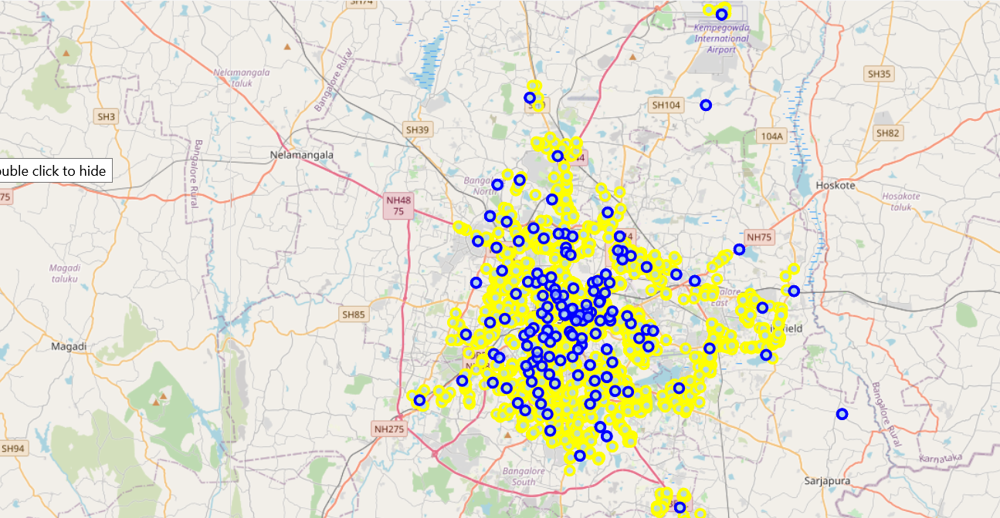

In [459]:


# one hot encoding
blr_onehot = pd.get_dummies(bangalore_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
blr_onehot['Neighborhood'] = bangalore_venues['Neighborhood'] 
#print(manhattan_onehot.head())
# move neighborhood column to the first column
fixed_columns = [blr_onehot.columns[-1]] + list(blr_onehot.columns[:-1])
print(fixed_columns)
blr_onehot = blr_onehot[fixed_columns]

blr_onehot.head()


['Yoga Studio', 'Accessories Store', 'Afghan Restaurant', 'Airport', 'Airport Service', 'Airport Terminal', 'American Restaurant', 'Andhra Restaurant', 'Arcade', 'Art Gallery', 'Art Museum', 'Arts & Crafts Store', 'Asian Restaurant', 'Athletics & Sports', 'Australian Restaurant', 'Auto Garage', 'Auto Workshop', 'Automotive Shop', 'BBQ Joint', 'Badminton Court', 'Bagel Shop', 'Bakery', 'Bar', 'Basketball Court', 'Beach', 'Bed & Breakfast', 'Beer Bar', 'Beer Garden', 'Bengali Restaurant', 'Big Box Store', 'Bistro', 'Boarding House', 'Bookstore', 'Botanical Garden', 'Boutique', 'Bowling Alley', 'Breakfast Spot', 'Brewery', 'Bubble Tea Shop', 'Building', 'Burger Joint', 'Burrito Place', 'Bus Station', 'Bus Stop', 'Business Service', 'Butcher', 'Cafeteria', 'Café', 'Candy Store', 'Capitol Building', 'Chaat Place', 'Chettinad Restaurant', 'Chinese Restaurant', 'Chocolate Shop', 'Clothing Store', 'Cocktail Bar', 'Coffee Shop', 'Comfort Food Restaurant', 'Concert Hall', 'Construction & Landsca

,Yoga Studio,Accessories Store,Afghan Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Andhra Restaurant,Arcade,Art Gallery,...,Track Stadium,Trail,Train Station,Travel & Transport,Udupi Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Women's Store
0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [460]:
blr_grouped = blr_onehot.groupby('Neighborhood').mean().reset_index()
blr_grouped

,Neighborhood,Yoga Studio,Accessories Store,Afghan Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Andhra Restaurant,Arcade,...,Track Stadium,Trail,Train Station,Travel & Transport,Udupi Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Women's Store
0,100 Ft / CMH Road,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010000,...,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.020000,0.00,0.000000,0.000000
1,Avlahalli,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.000000
2,Bomanahalli,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.022727,0.000000,...,0.00,0.000000,0.000000,0.000000,0.00,0.022727,0.000000,0.00,0.000000,0.000000
3,Hanumantnagar,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010000,...,0.00,0.000000,0.000000,0.000000,0.00,0.020000,0.000000,0.00,0.000000,0.000000
4,Jakasandra,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.020000,0.000000,0.000000,...,0.00,0.010000,0.000000,0.000000,0.00,0.010000,0.000000,0.00,0.000000,0.000000
5,Krishanrajpuram,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.017857,0.000000,0.000000,...,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.017857,0.00,0.000000,0.000000
6,Madhavnagar,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.020000,...,0.00,0.000000,0.000000,0.000000,0.00,0.030000,0.010000,0.00,0.000000,0.000000
7,Murgeshpalya,0.000000,0.011236,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00,0.000000,0.000000,0.000000,0.00,0.011236,0.000000,0.00,0.000000,0.011236
8,Padmanabhnagar,0.000000,0.013699,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.013699,...,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.000000
9,Ramaih Lyt,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00,0.000000,0.000000,0.000000,0.00,0.016393,0.000000,0.00,0.000000,0.000000


In [461]:
blr_grouped.shape

(148, 230)

In [462]:

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [463]:
import numpy as np
from sklearn.cluster import KMeans

In [464]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
Neighborhood_venues_sorted = pd.DataFrame(columns=columns)
Neighborhood_venues_sorted['Neighborhood'] = blr_grouped['Neighborhood']

for ind in np.arange(blr_grouped.shape[0]):
    Neighborhood_venues_sorted.iloc[ind, 1:] = return_most_common_venues(blr_grouped.iloc[ind, :], num_top_venues)

Neighborhood_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,100 Ft / CMH Road,Indian Restaurant,Pub,Café,Ice Cream Shop,Italian Restaurant,Burger Joint,BBQ Joint,Pizza Place,Cupcake Shop,Lounge
1,Avlahalli,Indian Restaurant,Gas Station,Restaurant,Café,Donut Shop,Diner,Discount Store,Dive Bar,Doner Restaurant,Women's Store
2,Bomanahalli,Indian Restaurant,Café,Ice Cream Shop,Sandwich Place,Tea Room,Chinese Restaurant,Pizza Place,Asian Restaurant,Bakery,Hotel Bar
3,Hanumantnagar,Indian Restaurant,Fast Food Restaurant,Café,Breakfast Spot,Ice Cream Shop,Coffee Shop,Park,Snack Place,Sandwich Place,Juice Bar
4,Jakasandra,Indian Restaurant,Café,Pizza Place,Ice Cream Shop,Italian Restaurant,Coffee Shop,Pub,Department Store,Snack Place,Chinese Restaurant


In [465]:
blr_grouped.head(25)

,Neighborhood,Yoga Studio,Accessories Store,Afghan Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Andhra Restaurant,Arcade,...,Track Stadium,Trail,Train Station,Travel & Transport,Udupi Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Women's Store
0,100 Ft / CMH Road,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.010000,...,0.00,0.00,0.0,0.0,0.0,0.000000,0.020000,0.00,0.000000,0.000000
1,Avlahalli,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00,0.00,0.0,0.0,0.0,0.000000,0.000000,0.00,0.000000,0.000000
2,Bomanahalli,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.022727,0.000000,...,0.00,0.00,0.0,0.0,0.0,0.022727,0.000000,0.00,0.000000,0.000000
3,Hanumantnagar,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.010000,...,0.00,0.00,0.0,0.0,0.0,0.020000,0.000000,0.00,0.000000,0.000000
4,Jakasandra,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.020000,0.000000,0.000000,...,0.00,0.01,0.0,0.0,0.0,0.010000,0.000000,0.00,0.000000,0.000000
5,Krishanrajpuram,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.017857,0.000000,0.000000,...,0.00,0.00,0.0,0.0,0.0,0.000000,0.017857,0.00,0.000000,0.000000
6,Madhavnagar,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.020000,...,0.00,0.00,0.0,0.0,0.0,0.030000,0.010000,0.00,0.000000,0.000000
7,Murgeshpalya,0.000000,0.011236,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00,0.00,0.0,0.0,0.0,0.011236,0.000000,0.00,0.000000,0.011236
8,Padmanabhnagar,0.000000,0.013699,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.013699,...,0.00,0.00,0.0,0.0,0.0,0.000000,0.000000,0.00,0.000000,0.000000
9,Ramaih Lyt,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00,0.00,0.0,0.0,0.0,0.016393,0.000000,0.00,0.000000,0.000000


In [466]:
# set number of clusters
kclusters = 5

blr_grouped_clustering = blr_grouped.drop('Neighborhood', 1)
# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(blr_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([1, 2, 2, 2, 0, 1, 2, 1, 0, 0], dtype=int32)

In [467]:
temp_blr_df = bangalore_boroughs[0].set_index(bangalore_boroughs[0]["Neighborhood"])
bangalore_neighbors.set_index(bangalore_neighbors["Neighbors"], inplace=True)
temp_blr_df.iloc[100:110]

,Neighborhood,Residential_rate,Commercial_rate
Neighborhood,,,
Murgeshpalya,Murgeshpalya,3500,4500
Kodihalli,Kodihalli,3500,4500
Airport Rd,Airport Rd,NaN,10000
Marathahalli,Marathahalli,2500,4000
Whitefield,Whitefield,1500,3000
ITPL,ITPL,1500,2500
Old Madras Road,Old Madras Road,NaN,1500
Varthur / Kundahalli,Varthur / Kundahalli,1000,1500
Ulsoor,Ulsoor,NaN,NaN


In [468]:

lat_lst = []
lon_lst = []

for neighbor in Neighborhood_venues_sorted['Neighborhood']:
    lat_lst.append(bangalore_neighbors.loc[neighbor]["Latitude"])
    lon_lst.append(bangalore_neighbors.loc[neighbor]["Longitude"])
    
Neighborhood_venues_sorted.insert(1, 'Latitude', lat_lst)
Neighborhood_venues_sorted.insert(2, 'Longitude', lon_lst)


In [469]:
Neighborhood_venues_sorted.insert(1, 'Cluster Labels', kmeans.labels_)

In [470]:
Neighborhood_venues_sorted.head()

,Neighborhood,Cluster Labels,Latitude,Longitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,100 Ft / CMH Road,1,12.978211,77.637951,Indian Restaurant,Pub,Café,Ice Cream Shop,Italian Restaurant,Burger Joint,BBQ Joint,Pizza Place,Cupcake Shop,Lounge
1,Avlahalli,2,13.136125,77.565524,Indian Restaurant,Gas Station,Restaurant,Café,Donut Shop,Diner,Discount Store,Dive Bar,Doner Restaurant,Women's Store
2,Bomanahalli,2,12.8983601,77.6179465,Indian Restaurant,Café,Ice Cream Shop,Sandwich Place,Tea Room,Chinese Restaurant,Pizza Place,Asian Restaurant,Bakery,Hotel Bar
3,Hanumantnagar,2,12.9425468,77.5625781,Indian Restaurant,Fast Food Restaurant,Café,Breakfast Spot,Ice Cream Shop,Coffee Shop,Park,Snack Place,Sandwich Place,Juice Bar
4,Jakasandra,0,12.9233948,77.6385778999999,Indian Restaurant,Café,Pizza Place,Ice Cream Shop,Italian Restaurant,Coffee Shop,Pub,Department Store,Snack Place,Chinese Restaurant


In [471]:
import matplotlib.cm as cm
import matplotlib.colors as colors

In [472]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip((Neighborhood_venues_sorted['Latitude']),(Neighborhood_venues_sorted['Longitude']), (Neighborhood_venues_sorted['Neighborhood']),(Neighborhood_venues_sorted['Cluster Labels'])):
    try:
        label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
        folium.CircleMarker(
                [lat, lon],
                radius=5,
                popup=label,
                color=rainbow[int(cluster)-1],
                fill=True,
                fill_color=rainbow[cluster-1],
                fill_opacity=0.7).add_to(map_clusters)
    except:
        print("Location not plotted: ",poi)
map_clusters

Location not plotted:  Electronic City


In [473]:
res_rate = []
cluster_data = []
area_lst = []
temp_df = bangalore_residential.set_index(bangalore_residential['Neighborhood'])
temp_df2 = Neighborhood_venues_sorted.set_index(Neighborhood_venues_sorted["Neighborhood"])


for area in Neighborhood_venues_sorted['Neighborhood']:
    area1 = area.strip()
    if(area in list(temp_df["Neighborhood"])):
        area_lst.append(area1)
        res_rate.append(temp_df.loc[area1]["Residential_rate"])
        cluster_data.append(temp_df2.loc[area]["Cluster Labels"])
    else:
       print(area)


 100 Ft / CMH Road
 Avlahalli
 Bomanahalli
 Hanumantnagar
 Jakasandra
 Krishanrajpuram
 Madhavnagar
 Murgeshpalya
 Padmanabhnagar
 Ramaih Lyt
 Ramurthy Nagar
 Sadashivnagar
 Shankarpuram
 Thyagarajnagar
 Varthur / Kundahalli
Adugodi
Airport Rd
Anand Rao circle
Avenue Rd
BLR – SOUTH
BLR – SOUTH-WEST
Bellandur
Binnypet
Chamrajpet
Chickpet
Commercial Street
Cottonpet/Balepet
Cox Town
Dickenson Rd
Hebbal main rd
Hosur Rd
Indiranagar
JC Rd
K Kamraj Rd
KG Rd
KORAMANGALA
Kalasipalyam
Kasturba Rd
MG Road
Madivala
Malleswaram
Old Madras Road
Peenya
Rajaram Mohan Roy Rd
Residency Rd
Sampige Rd
Siddapura Rd
TCM Royan Rd
Timber Yard Layout
Ulsoor
Vidhan Soudha


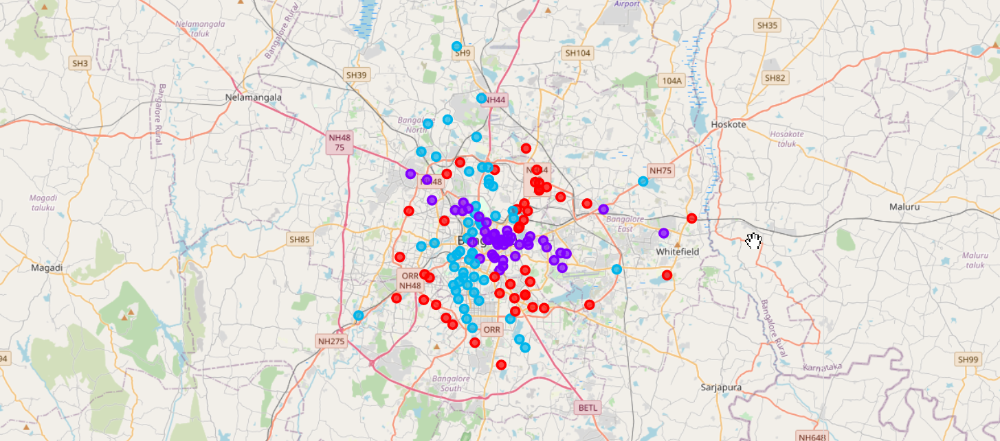

In [474]:
residential_df = pd.DataFrame()
residential_df["Area"] = area_lst
residential_df["Residential_rate"]  = res_rate
residential_df["Cluster"] = cluster_data
residential_df.head()

,Area,Residential_rate,Cluster
0,Ashokanagar,2500,2
1,BTM Layout,4000,2
2,Banashankari,3500,2
3,Banaswadi,3000,0
4,Bannerghatta Rd,2500,0


In [475]:
com_rate = []
cluster_data = []
area_lst = []
temp_df = bangalore_commercial.set_index(bangalore_commercial['Neighborhood'])
temp_df2 = Neighborhood_venues_sorted.set_index(Neighborhood_venues_sorted["Neighborhood"])


for area in Neighborhood_venues_sorted['Neighborhood']:
    area1 = area.strip()
    if(area in list(temp_df["Neighborhood"])):
        area_lst.append(area1)
        com_rate.append(temp_df.loc[area1]["Commercial_rate"])
        cluster_data.append(temp_df2.loc[area]["Cluster Labels"])
    else:
       print(area)
    
commercial_df = pd.DataFrame()
commercial_df["Area"] = area_lst
commercial_df["Commercial_rate"]  = com_rate
commercial_df["Cluster"] = cluster_data
commercial_df.head()

 100 Ft / CMH Road
 Avlahalli
 Bomanahalli
 Hanumantnagar
 Jakasandra
 Krishanrajpuram
 Madhavnagar
 Murgeshpalya
 Padmanabhnagar
 Ramaih Lyt
 Ramurthy Nagar
 Sadashivnagar
 Shankarpuram
 Thyagarajnagar
 Varthur / Kundahalli
BLR – SOUTH
BLR – SOUTH-WEST
Bellandur
Cox Town
Cubbon Rd
Indiranagar
K Kamraj Rd
KORAMANGALA
Malleswaram
Shantinagar
Ulsoor
Vidhan Soudha


,Area,Commercial_rate,Cluster
0,Adugodi,6000,0
1,Airport Rd,10000,1
2,Anand Rao circle,15000,2
3,Ashokanagar,5000,2
4,Avenue Rd,15000,2


In [499]:
import matplotlib.pyplot as plt

#### Lets investigate cluster 0,1,2 for commercial space.

         Area  Commercial_rate
Cluster                       
0          37               37
1          36               36
2          46               46
3           1                1
4           1                1


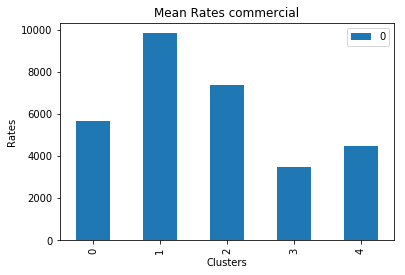

In [505]:
comm_cluster_mean = []
commercial_df["Commercial_rate"] = commercial_df["Commercial_rate"].astype(str).astype(int)
for i in range(5):
    comm_cluster_mean.append(commercial_df.loc[commercial_df['Cluster'] == i]["Commercial_rate"].mean())

comm_cluster_mean
print(commercial_df.groupby(["Cluster"]).count())
comm_cluster_mean_df = pd.DataFrame(comm_cluster_mean)
comm_cluster_mean_df.plot(kind="Bar")
plt.xlabel("Clusters")
plt.ylabel("Rates")
plt.title("Mean Rates commercial")
plt.show()

         Area  Residential_rate
Cluster                        
0          32                32
1          29                29
2          34                34
3           1                 1
4           1                 1
             0
0  3437.500000
1  6579.310345
2  4247.058824
3  1500.000000
4  2500.000000


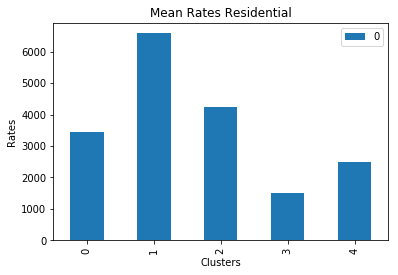

In [504]:
#residential_df.drop(index = [61],inplace=True)
residential_df["Residential_rate"] = residential_df["Residential_rate"].astype(str).astype(int)
res_cluster_mean = []
for i in range(5):
    res_cluster_mean.append(residential_df.loc[residential_df['Cluster'] == i]["Residential_rate"].mean())

res_cluster_mean
print(residential_df.groupby(["Cluster"]).count())
res_cluster_mean_df = pd.DataFrame(res_cluster_mean)
print(res_cluster_mean_df)
res_cluster_mean_df.plot(kind="Bar")
plt.xlabel("Clusters")
plt.ylabel("Rates")
plt.title("Mean Rates Residential")
plt.show()

In [492]:
#Cluster1
Neighborhood_venues_sorted.loc[Neighborhood_venues_sorted['Cluster Labels'] == 1, Neighborhood_venues_sorted.columns[[0] + list(range(4, Neighborhood_venues_sorted.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,100 Ft / CMH Road,Indian Restaurant,Pub,Café,Ice Cream Shop,Italian Restaurant,Burger Joint,BBQ Joint,Pizza Place,Cupcake Shop,Lounge
5,Krishanrajpuram,Fast Food Restaurant,Coffee Shop,Clothing Store,French Restaurant,Donut Shop,Café,Sporting Goods Shop,Shopping Mall,Lounge,Bowling Alley
7,Murgeshpalya,Indian Restaurant,Restaurant,Café,Ice Cream Shop,Bar,Pub,Fast Food Restaurant,Burger Joint,Hotel,Korean Restaurant
16,Airport Rd,Indian Restaurant,Hotel,Lounge,Café,Brewery,Ice Cream Shop,Park,Asian Restaurant,Breakfast Spot,Pub
20,BLR – SOUTH,Coffee Shop,Café,Airport Service,Airport Terminal,Brewery,Doner Restaurant,French Restaurant,Beer Bar,Sandwich Place,Taxi Stand
21,BLR – SOUTH-WEST,Coffee Shop,Café,Airport Service,Airport Terminal,Brewery,Doner Restaurant,French Restaurant,Beer Bar,Sandwich Place,Taxi Stand
31,Cambridge Rd,Indian Restaurant,Café,Pub,Chinese Restaurant,Hotel,Tea Room,Andhra Restaurant,Ice Cream Shop,Bar,Brewery
35,Church Street,Hotel,Indian Restaurant,Lounge,Pub,Ice Cream Shop,Brewery,Café,Shopping Mall,Japanese Restaurant,Tea Room
36,Commercial Street,Indian Restaurant,Hotel,Lounge,Ice Cream Shop,Café,Pub,Brewery,Plaza,Chinese Restaurant,Gym
40,Cubbon Rd,Hotel,Indian Restaurant,Pub,Lounge,Ice Cream Shop,Brewery,Café,Shopping Mall,Tea Room,Plaza


In [493]:
#Cluster3
Neighborhood_venues_sorted.loc[Neighborhood_venues_sorted['Cluster Labels'] == 3, Neighborhood_venues_sorted.columns[[0] + list(range(4, Neighborhood_venues_sorted.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
30,CV Raman Nagar,Fried Chicken Joint,Café,Optical Shop,Restaurant,Women's Store,Dim Sum Restaurant,Event Space,Electronics Store,Eastern European Restaurant,Duty-free Shop


In [494]:
#Cluster0
Neighborhood_venues_sorted.loc[Neighborhood_venues_sorted['Cluster Labels'] == 0, Neighborhood_venues_sorted.columns[[0] + list(range(4, Neighborhood_venues_sorted.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,Jakasandra,Indian Restaurant,Café,Pizza Place,Ice Cream Shop,Italian Restaurant,Coffee Shop,Pub,Department Store,Snack Place,Chinese Restaurant
8,Padmanabhnagar,Indian Restaurant,Café,Fast Food Restaurant,Ice Cream Shop,Pizza Place,Breakfast Spot,Clothing Store,Snack Place,Bakery,Restaurant
9,Ramaih Lyt,Indian Restaurant,Café,Korean Restaurant,Fast Food Restaurant,Bakery,BBQ Joint,Ice Cream Shop,Lounge,Kerala Restaurant,Pizza Place
10,Ramurthy Nagar,Pizza Place,Indian Restaurant,Café,Arts & Crafts Store,Music Venue,Fast Food Restaurant,Department Store,Asian Restaurant,Furniture / Home Store,South Indian Restaurant
14,Varthur / Kundahalli,Café,Restaurant,Indian Restaurant,Pizza Place,Multiplex,Brewery,Shopping Mall,Food Court,Spa,Lake
15,Adugodi,Indian Restaurant,Café,Fast Food Restaurant,Coffee Shop,Gym,Multiplex,Lounge,Dessert Shop,Breakfast Spot,Park
24,Banaswadi,Indian Restaurant,Café,Ice Cream Shop,Pizza Place,Korean Restaurant,Bistro,Fast Food Restaurant,Coffee Shop,BBQ Joint,Andhra Restaurant
25,Bannerghatta Rd,Indian Restaurant,Café,Chinese Restaurant,Lounge,Dessert Shop,Bakery,Juice Bar,Bookstore,Coffee Shop,Restaurant
27,Bellandur,Café,Indian Restaurant,Fast Food Restaurant,Coffee Shop,Hotel,Ice Cream Shop,Pizza Place,Lounge,Moving Target,Bakery
33,Chandra Layout,Café,Indian Restaurant,Ice Cream Shop,Fast Food Restaurant,South Indian Restaurant,Pizza Place,Construction & Landscaping,Sandwich Place,Restaurant,Bus Station


In [495]:
#Cluster4
Neighborhood_venues_sorted.loc[Neighborhood_venues_sorted['Cluster Labels'] == 4, Neighborhood_venues_sorted.columns[[0] + list(range(4, Neighborhood_venues_sorted.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
62,IT I colony,Snack Place,Chinese Restaurant,Indian Restaurant,Food Truck,Women's Store,Diner,Falafel Restaurant,Event Space,Electronics Store,Eastern European Restaurant


In [496]:
#Cluster2
Neighborhood_venues_sorted.loc[Neighborhood_venues_sorted['Cluster Labels'] == 2, Neighborhood_venues_sorted.columns[[0] + list(range(4, Neighborhood_venues_sorted.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Avlahalli,Indian Restaurant,Gas Station,Restaurant,Café,Donut Shop,Diner,Discount Store,Dive Bar,Doner Restaurant,Women's Store
2,Bomanahalli,Indian Restaurant,Café,Ice Cream Shop,Sandwich Place,Tea Room,Chinese Restaurant,Pizza Place,Asian Restaurant,Bakery,Hotel Bar
3,Hanumantnagar,Indian Restaurant,Fast Food Restaurant,Café,Breakfast Spot,Ice Cream Shop,Coffee Shop,Park,Snack Place,Sandwich Place,Juice Bar
6,Madhavnagar,Indian Restaurant,Hotel,Coffee Shop,Dessert Shop,Restaurant,Vegetarian / Vegan Restaurant,Ice Cream Shop,Chinese Restaurant,Juice Bar,Café
11,Sadashivnagar,Indian Restaurant,Ice Cream Shop,Coffee Shop,Hotel,Vegetarian / Vegan Restaurant,Café,Chinese Restaurant,Breakfast Spot,Juice Bar,Nightclub
12,Shankarpuram,Indian Restaurant,Fast Food Restaurant,Café,Coffee Shop,Park,Ice Cream Shop,Breakfast Spot,Sandwich Place,Theater,Restaurant
13,Thyagarajnagar,Indian Restaurant,Fast Food Restaurant,Ice Cream Shop,Café,Coffee Shop,Pizza Place,Asian Restaurant,Restaurant,Juice Bar,Breakfast Spot
17,Anand Rao circle,Indian Restaurant,Hotel,Café,Clothing Store,Ice Cream Shop,Coffee Shop,Restaurant,Fast Food Restaurant,Karnataka Restaurant,Pizza Place
18,Ashokanagar,Indian Restaurant,Fast Food Restaurant,Ice Cream Shop,Breakfast Spot,Café,Coffee Shop,Sandwich Place,Bakery,Italian Restaurant,Asian Restaurant
19,Avenue Rd,Indian Restaurant,Hotel,Vegetarian / Vegan Restaurant,Coffee Shop,Lounge,Café,Japanese Restaurant,Mexican Restaurant,Bakery,Theater


In [498]:
print("Average residential price: ",residential_df["Residential_rate"].mean())
print("Average commercial price: ",commercial_df["Commercial_rate"].mean())

Average residential price:  4630.927835051546
Average commercial price:  7519.834710743801


## Analysis

Cluster 1 has many eateries, all round facilities.
Cluster 3 The residential and commercial rates are cheap and locality also is fine
cluster 0 An average City area, this means, its a perfect combination of Residential and commercial space.
cluster 4 Facilities are less and rates are more
cluster 2 The rates are below average and adequate facilities.


# <i>THANK YOU!</i>